In [2]:
from tensorflow.keras.datasets import mnist
from keras import layers,models
import numpy as np
import matplotlib.pyplot as plt
import keras

2025-02-19 10:43:41.010313: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-02-19 10:43:41.122628: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1739972621.171383    4777 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1739972621.186728    4777 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-02-19 10:43:41.292827: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

In [3]:
(x_train, y_train), (x_test, y_test) = mnist.load_data()

In [4]:
x_train, x_test = x_train / 255.0, x_test / 255.0

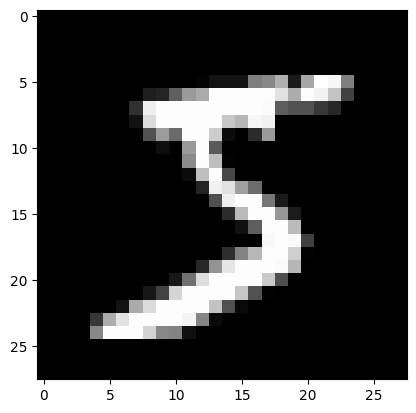

In [5]:
plt.imshow(x_train[0],cmap="gray")

In [6]:
import tensorflow as tf
tf.random.set_seed(42)

In [7]:
gerador = tf.keras.Sequential([
                               tf.keras.layers.Dense(units = 128, activation = 'relu'),
                               tf.keras.layers.Dense(units = 128, activation = 'relu'),
                               tf.keras.layers.Dense(units = 784, activation = 'tanh')
                               ])

In [8]:
ruido_teste = tf.random.uniform(shape = (1, 100), minval = -1, maxval = 1)
amostra = gerador(ruido_teste)

2025-02-19 10:43:44.589425: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


In [9]:
amostra.shape

TensorShape([1, 784])

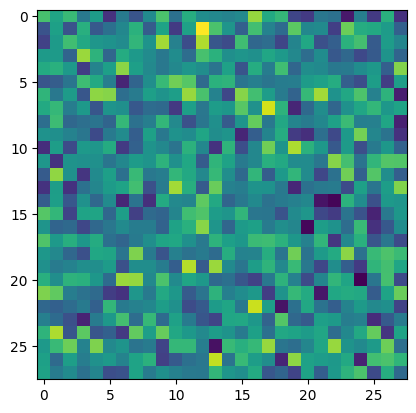

In [10]:
plt.imshow(amostra.numpy().reshape(28, 28))

In [11]:
tf.random.set_seed(42)

In [12]:
discriminador = tf.keras.Sequential([
                                     tf.keras.layers.Dense(units = 128, activation = 'relu'),
                                     tf.keras.layers.Dense(units = 128, activation = 'relu'),
                                     tf.keras.layers.Dense(units = 1)
                                     ])

In [13]:
features = x_train[:100].reshape(-1,784)

features.shape

(100, 784)

In [14]:
features = tf.reshape(features, shape = (-1, 784))
logits = discriminador(features)
logits.shape

TensorShape([100, 1])

In [15]:
logits

<tf.Tensor: shape=(100, 1), dtype=float32, numpy=
array([[ 2.6053649e-01],
       [ 2.2146299e-02],
       [-1.7374186e-01],
       [ 1.1839081e-01],
       [-2.6833600e-01],
       [-4.8993284e-01],
       [-2.3280755e-01],
       [-1.7879230e-01],
       [-5.8390338e-02],
       [-1.9640337e-01],
       [ 7.0477799e-02],
       [ 6.3292764e-02],
       [ 3.3160055e-01],
       [-3.7441275e-01],
       [ 4.7480613e-03],
       [-5.4327440e-01],
       [-9.0388104e-02],
       [-7.5657099e-02],
       [-3.5041299e-02],
       [ 3.2965899e-02],
       [-1.6159086e-01],
       [-2.3279990e-01],
       [-2.5590324e-01],
       [ 5.8088414e-02],
       [ 3.0298878e-02],
       [-3.5627091e-01],
       [-5.0336272e-03],
       [-6.3900605e-02],
       [ 8.3867908e-03],
       [-3.4815130e-01],
       [-1.0522942e-01],
       [-3.2250488e-01],
       [-3.0068123e-01],
       [-3.2132232e-01],
       [-1.8296447e-01],
       [ 7.8883365e-02],
       [-1.0213282e-02],
       [-5.5888200e-01],


In [16]:
batch_size = 100
amostras_teste = []
treinamento_discriminador = tf.keras.optimizers.Adam(learning_rate=0.001)
treinamento_gerador = tf.keras.optimizers.Adam(learning_rate=0.001)

for epoca in range(300):
    erro_gerador_batch = 0.
    erro_discriminador_batch = 0.
    n_batches = 0
    
    for i in range(0, len(x_train), batch_size):
        x_batch = x_train[i:i+batch_size] * 2 - 1
        if x_batch.shape[0] != batch_size:
            continue 
        
        n_batches += 1
        imagens_reais = x_batch.reshape(batch_size, -1)
        batch_ruido = tf.random.uniform(shape=(batch_size, 100), minval=-1, maxval=1)
        
        with tf.GradientTape() as tape_gerador, tf.GradientTape() as tape_discriminador:
            imagem_ruido = gerador(batch_ruido)
            
            logits_imagens_reais = discriminador(imagens_reais)
            logits_imagens_ruidos = discriminador(imagem_ruido)
            
            erro_gerador = tf.reduce_mean(
                tf.nn.sigmoid_cross_entropy_with_logits(
                    labels=tf.ones_like(logits_imagens_ruidos), logits=logits_imagens_ruidos
                )
            )
            
            erro_discriminador_real = tf.reduce_mean(
                tf.nn.sigmoid_cross_entropy_with_logits(
                    labels=tf.ones_like(logits_imagens_reais), logits=logits_imagens_reais
                )
            )
            
            erro_discriminador_ruidos = tf.reduce_mean(
                tf.nn.sigmoid_cross_entropy_with_logits(
                    labels=tf.zeros_like(logits_imagens_ruidos), logits=logits_imagens_ruidos
                )
            )
            
            erro_discriminador = erro_discriminador_real + erro_discriminador_ruidos
            
            gradients_gerador = tape_gerador.gradient(erro_gerador, gerador.trainable_variables)
            treinamento_gerador.apply_gradients(zip(gradients_gerador, gerador.trainable_variables))
            
            gradients_discriminador = tape_discriminador.gradient(erro_discriminador, discriminador.trainable_variables)
            treinamento_discriminador.apply_gradients(zip(gradients_discriminador, discriminador.trainable_variables))
            
            erro_gerador_batch += erro_gerador.numpy()
            erro_discriminador_batch += erro_discriminador.numpy()
        
            erro_gerador_batch /= n_batches
            erro_discriminador_batch /= n_batches
    
            print(f'Época: {epoca + 1}, Erro D: {erro_discriminador_batch}, Erro G: {erro_gerador_batch}')
    
    ruido_teste = tf.random.uniform(shape=(1, 100), minval=-1, maxval=1)
    imagem_gerada = gerador(ruido_teste)
    amostras_teste.append(imagem_gerada.numpy().reshape(28, 28))


Época: 1, Erro D: 1.317317247390747, Erro G: 0.6725494861602783
Época: 1, Erro D: 1.0996997356414795, Erro G: 0.6253026723861694
Época: 1, Erro D: 0.6725888848304749, Erro G: 0.38077613711357117
Época: 1, Erro D: 0.4200313091278076, Erro G: 0.209598571062088
Época: 1, Erro D: 0.2985021471977234, Erro G: 0.12614315748214722
Época: 1, Erro D: 0.24904470145702362, Erro G: 0.08168245106935501
Época: 1, Erro D: 0.21216981112957, Erro G: 0.06110941991209984
Época: 1, Erro D: 0.18975453078746796, Erro G: 0.047642238438129425
Época: 1, Erro D: 0.16653214395046234, Erro G: 0.04070895537734032
Época: 1, Erro D: 0.1406979262828827, Erro G: 0.03853677213191986
Época: 1, Erro D: 0.11882930248975754, Erro G: 0.037756118923425674
Época: 1, Erro D: 0.09359854459762573, Erro G: 0.04148294776678085
Época: 1, Erro D: 0.0685090720653534, Erro G: 0.049634553492069244
Época: 1, Erro D: 0.0479259230196476, Erro G: 0.060634251683950424
Época: 1, Erro D: 0.03319241851568222, Erro G: 0.07221878319978714
Época: 

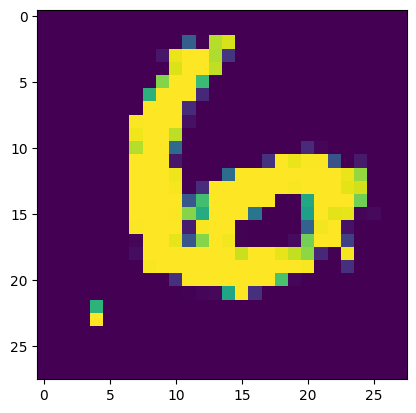

In [24]:
plt.imshow(amostras_teste[-1].reshape(28,28))